# Inviscid Burgers' equation

The PDE to be solved is Burgers' equation
$$
u_t + \frac12 (u)^2_x = 0,
$$
in $[\ell_b, u_b]\times[0,T]$,  with $u(x,0)=u_0(x)$.

## Libraries and Dependencies

In [1]:
import sys
import torch
from collections import OrderedDict

from pyDOE import lhs
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
import time

np.random.seed(1234)

In [2]:
# CUDA support 
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

## Physics-informed Neural Networks

In [3]:
# General deep neural network class
class DNN(torch.nn.Module):   #Subclassing torch's nn module
    def __init__(self, layers): #layer is a list of integers with the number of neurons in each layer
        super(DNN, self).__init__() #The same as super().__init__()
        
        #Parameters
        self.depth = len(layers) - 1
        
        # Activation function
        self.activation = torch.nn.Tanh

        # Set up ordered dictionary with layers
        layerDict = OrderedDict()
        for i in range(self.depth - 1):
            layerDict[f"layer_{i}"] = torch.nn.Linear(layers[i], layers[i+1])
            layerDict[f"activation_{i}"] = self.activation()
        layerDict[f"layer_{self.depth-1}"] = torch.nn.Linear(layers[-2], layers[-1])
        
        # deploy layers
        self.layers = torch.nn.Sequential(layerDict)
        
    def forward(self, x): #Forward pass
        out = self.layers(x)
        return out

There are two loss functions:
- The mean squared error of the PDE residual (We use the automatic differentiation to compute the derivatives)
$$
\mathcal{L}_{\mathrm{f}} = \frac{1}{N_{\mathrm{f}}}\sum_{i=1}^{N_{\mathrm{f}}} f(x_i,t_i)= \frac{1}{N_{\mathrm{f}}}\sum_{i=1}^{N_{\mathrm{f}}} \left[\left( u_t + u u_x - \nu u_{xx} \right)^2\right]_{x=x_i,t=t_i}
$$
- The mean squared error of the initial condition and boundary conditions
$$
\mathcal{L}_{\mathrm{u}} = \frac{1}{N_{\mathrm{u}}}\sum_{i=1}^{N_{\mathrm{u}}} \left( u(x_k,t_k) - u_k\right)^2,
$$ 
where $u_k$ is the known value of the solution at the $k$-th boundary point.

In [4]:
# the physics-guided neural network
class PhysicsInformedNN():
    def __init__(self, X_u, u, X_f, layers, lb, ub):#, nu):
        
        # boundary conditions
        self.lb = torch.tensor(lb).float().to(device)
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)
        self.u = torch.tensor(u).float().to(device)
        
        self.layers = layers
        
        # deep neural networks
        self.dnn = DNN(layers).to(device)
        # Defining optimizer
        self.optimizer = torch.optim.LBFGS(
            self.dnn.parameters(), 
            lr=1.0, 
            max_iter=50000, 
            max_eval=None,
            tolerance_grad=1e-5, 
            tolerance_change= 1e-9, 
            history_size=100,
            line_search_fn="strong_wolfe",  
        )

        self.iter = 0
        
    def net_u(self, x, t): 
        """ Here net_u represents the neural network approximation of the solution u""" 
        u = self.dnn(torch.cat([x, t], dim=1))
        return u
    
    def net_f(self, x, t):
        """ Here net_f represents the residual function
        f(u) = u_t + u * u_x,
        where u is net_u, the neural network output, and the derivatives
        are calculated with automatic differentiation.
        """
        u = self.net_u(x, t)
        
        u_t = torch.autograd.grad(
            u, t, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = (1/(0.1*(abs(u_x)-u_x)+1))*(u_t + u * u_x) #Forcing the loss function to be small near shocks following Li Liu et al. 2022
        return f

    
    def loss_func(self):
        self.optimizer.zero_grad()
        
        u_pred = self.net_u(self.x_u, self.t_u)
        f_pred = self.net_f(self.x_f, self.t_f)
        loss_u = torch.mean((self.u - u_pred) ** 2)
        loss_f = torch.mean(f_pred ** 2)
        
        loss = 10*loss_u + loss_f
        
        loss.backward()
        self.iter += 1
        if self.iter % 100 == 0:
            print(
                f"Iter {self.iter}, Loss: {loss.item():.5e}, Loss_u: {loss_u.item():.5e}, Loss_f: {loss_f.item():.5e}"
            )
        return loss
    
    def train(self):
        self.dnn.train()
        # Backward and optimize
        self.optimizer.step(self.loss_func)

            
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval()
        u = self.net_u(x, t)
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy()
        f = f.detach().cpu().numpy()
        return u, f

## Configurations

In [5]:
noise = 0.0        

N_u = 100
N_f = 50000
layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 1]

data = np.load("./data/burgers_data_CLAWPACK.npy", allow_pickle=True).item()


t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T

X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))
u_star = Exact.flatten()[:,None]              

# Domain bounds
lb = X_star.min(0)
ub = X_star.max(0)    

xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) # each row contains [x,t=0]
uu1 = Exact[0:1,:].T # each row contains u(x,t=0)
xx2 = np.hstack((X[:,0:1], T[:,0:1])) # each row contains [x=-1,t]
uu2 = Exact[:,0:1] # each row contains u(x=-1,t)
xx3 = np.hstack((X[:,-1:], T[:,-1:])) # each row contains [x=1,t]
uu3 = Exact[:,-1:] # each row contains u(x=1,t)

X_u_train = np.vstack([xx1, xx2, xx3])
X_f_train = lb + (ub-lb)*lhs(2, N_f) #Generating N_f random points in the domain
X_f_train = np.vstack((X_f_train, X_u_train))
u_train = np.vstack([uu1, uu2, uu3])

idx = np.random.choice(X_u_train.shape[0], N_u, replace=False) #Choosing N_u random points from the (space and time) boundary 
X_u_train = X_u_train[idx, :]
u_train = u_train[idx,:]

## Training

In [6]:
model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub)

In [7]:
%%time
N_epochs = 5
for epoch in range(N_epochs):
    model.train() 
   

Iter 100, Loss: 4.10018e-01, Loss_u: 1.10536e-02, Loss_f: 2.99481e-01
Iter 200, Loss: 3.00048e-01, Loss_u: 4.90817e-03, Loss_f: 2.50966e-01
Iter 300, Loss: 2.52644e-01, Loss_u: 4.09585e-03, Loss_f: 2.11685e-01
Iter 400, Loss: 2.21901e-01, Loss_u: 2.44722e-03, Loss_f: 1.97429e-01
Iter 500, Loss: 2.12405e-01, Loss_u: 2.09435e-03, Loss_f: 1.91461e-01
Iter 600, Loss: 1.89257e-01, Loss_u: 1.92236e-03, Loss_f: 1.70033e-01
Iter 700, Loss: 1.64159e-01, Loss_u: 1.42319e-03, Loss_f: 1.49927e-01
Iter 800, Loss: 1.45411e-01, Loss_u: 1.00120e-03, Loss_f: 1.35399e-01
Iter 900, Loss: 1.33801e-01, Loss_u: 9.56356e-04, Loss_f: 1.24237e-01
Iter 1000, Loss: 1.22475e-01, Loss_u: 6.99377e-04, Loss_f: 1.15481e-01
Iter 1100, Loss: 1.15640e-01, Loss_u: 6.02592e-04, Loss_f: 1.09614e-01
Iter 1200, Loss: 1.06444e-01, Loss_u: 7.65493e-04, Loss_f: 9.87890e-02
Iter 1300, Loss: 1.00970e-01, Loss_u: 6.80861e-04, Loss_f: 9.41616e-02
Iter 1400, Loss: 9.38938e-02, Loss_u: 5.62488e-04, Loss_f: 8.82689e-02
Iter 1500, Loss

In [8]:
u_pred, f_pred = model.predict(X_star)

error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
print('Global error u: %e' % (error_u))                     


Global error u: 3.003089e-01


## Visualizations

In [9]:
#Retrieving reference data and evaluating the model on a refined grid
x_test = data["x"]
t_test = data["t"]

extrapolation_time = np.linspace(1.,3,200)

u_exact = []
u_frames = []
for j in range(len(t_test)):
   u_test, _ = model.predict(np.hstack((x_test.reshape(-1,1), t_test[j]*np.ones((len(x_test),1)))))
   u_frames.append(u_test)
   u_exact.append(data["usol"][:,j])

for k in range(1,len(extrapolation_time)):
   u_test, _ = model.predict(np.hstack((x_test.reshape(-1,1), extrapolation_time[k]*np.ones((len(x_test),1)))))
   u_frames.append(u_test)

#### Static plots

The PINN is evaluated in a refined grid, where it was not trained.

In [10]:
list_training_idxs = []
u_predict_training = []
for time in [0.25,0.5,0.75]:
    t = time
    list_training_idxs.append([i for i, training_t in enumerate(X_f_train[:,1]) if abs(t - training_t) < 1.e-4])
    u_predict_training.append(model.predict(X_f_train[list_training_idxs[-1]])[0])

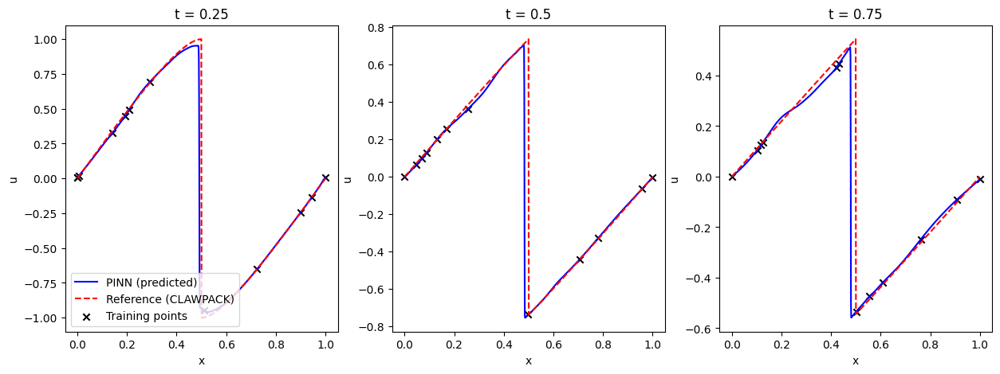

In [11]:
#Three horizontal axes
fig, ax = plt.subplots(1,3, figsize=(15,5))
for i in range(3):
    ax[i].plot(x_test, u_frames[25+i*25], 'b-', label='PINN (predicted)')
    ax[i].plot(x_test, u_exact[25+i*25], 'r--', label='Reference (CLAWPACK)')
    ax[i].scatter(X_f_train[list_training_idxs[i],0], u_predict_training[i], color='black', marker='x', label='Training points')
    ax[i].set_xlabel('x')
    ax[i].set_ylabel('u')
    ax[i].set_title(f"t = {t_test[25+i*25][0]}")
ax[0].legend(loc='lower left')

### Animation

In [12]:
list_training_idxs = []
u_predict_training = []
for time in t_test:
    t = time[0]
    list_training_idxs.append([i for i, training_t in enumerate(X_f_train[:,1]) if abs(t - training_t) < 1.e-4])
    u_predict_training.append(model.predict(X_f_train[list_training_idxs[-1]])[0])

In [13]:
def animation_function(x_test,t_test, u_frames, u_exact):
    from matplotlib import animation, rc
    from IPython.display import HTML
    #Define everything
    fig, ax = plt.subplots()
    ax.set_xlim(( min(x_test), max(x_test)))
    ax.set_ylim((-1.1, 1.1))
    ax.set_xlabel('$x$')

    ax.plot([-0.1, 1.1], [0, 0], 'k--', lw=1)
    ax.set_ylabel('$u(t,x)$')
    original_title = f'1D Inviscid Burgers\' Equation'
    ax.set_title(original_title)
    line1, = ax.plot([], [], lw=2, label='PINN')
    line2, = ax.plot([], [], lw=2, label='Reference (CLAWPACK)', color='black', linestyle='dotted')
    dots = ax.scatter([], [], s=20, c='g', marker='x', label='Training ICs')
    dots2 = ax.scatter([], [], s=20, c='r', marker='o', label='Training PDE')

    reduced_idx = np.array([i for i in idx if i<xx1.shape[0]-1 ])

    
    #Initialization function
    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        dots.set_offsets(np.column_stack(([], [])))
        dots2.set_offsets(np.column_stack(([], [])))

        return line1, line2, dots

    #Animation function
    def animate(i):
        x = x_test
        if i<=len(u_exact)-1:
            line1.set_data(x, u_frames[i])
            line2.set_data(x, u_exact[i])
            if i==0:
                dots2.set_offsets(np.column_stack(([], [])))
            else:
                dots2.set_offsets(np.column_stack((X_f_train[list_training_idxs[i],0], u_predict_training[i])))
        else:
            line1.set_color('r')
            line1.set_data(x, u_frames[i])
            line2.set_data([], [])
            dots2.set_offsets(np.column_stack(([], [])))
        if i==0:
            dots.set_offsets(np.column_stack((xx1[reduced_idx,0], uu1[reduced_idx,0])))
        else:
            dots.set_offsets(np.column_stack(([], [])))
        return line1, line2, dots
    #Call the animator
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                    frames=len(u_frames), interval=60, blit=True)
    plt.legend()
    plt.close()
    #plot the animation
    return HTML(anim.to_jshtml())


Once the PINN line becomes red, we are extrapolating in time.
Training ICs denotes the PINN evaluated at points that where used to enforce the initial condition.
Training PDE denotes the PINN evaluated at points that where used to enforce the PDE.

In [14]:
plot = animation_function(x_test,t_test,u_frames, u_exact)
plot